<a href="https://colab.research.google.com/github/palich2000/Airbus/blob/main/Airbus.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Что это и зачем єто все ?
Меня по работе интереует возможность запуска моделей на носимых устройствах (это на пример тепловизор или дрон)
Для этого необходимо научить модель (дообучить) конвертировать ее в TFLite формат и запустить на устройстве или на CPU или на TPU при его наличии.
У меня в наличии есть Coral TPU USB, на этом собственно и буду пытаться это все запустить. Потом возможно на SOC RENESAS RZ/V2H
Что бы долго не блуждать в датасетах решил использовать то что есть и 100% работает.
Далее как бы все на словах было просто.
Научить модель YOLO, экспортировать ее в формат TFLite и скомпилировать ее средствами colral и запустить сначала на прочессоре а потом на TPU.
Средствами уже tensorflow.
Что я собственно и сделал.
В идеале надо полностью отказаться от YOLO (имеется ввиду на этапе детекции) но времени особо не было поэтому получилось как получилось. За одно разобрался с Annotator - штука для ленивых и colab в соединении его с googledrive.
В идеале деплой использование модели написать на C++, будет чуть быстрее. Но для курсового проетка и понимаия что это в принципе возможно и это работает будет норм и на питончике.



In [ ]:
from google.colab import drive
drive.mount('/content/data/', force_remount=True)

Mounted at /content/data/


In [ ]:
drive.flush_and_unmount()

In [ ]:
%%sh
mkdir -p ~/.ssh
echo 'ssh-rsa AAAAB3NzaC1yc2EAAAADAQABAAABgQDb9mjmFbgEsAlIWxYl6VtdcOsZXAP+1fP59FYlEP1OzcsPm6xHKy0BhbLSpIBPwYAh2ETEtWCfhC3zLyCT+RWdyo+o4GSxM/L8b4PkMduQDHR514G51bcnqjAPpyytulI3B0mU9kaGk5ylI49ou40X88ZHRkTJLrcYAhVoWabNCXD1EiY5UXwB7AZwEmtdozUMAZvA7EUuUuJWidOJxEL9+9OBAIwD+YUl91HN3bHNZlxCuRjGgVB+60QqjJKobcDyKUbe+L/smIoiYbSASYo9Hpr8ydg9N/npThK2yq4tAsuVVG4vsOASXKLB0CIP9jmtCA5A3nNgbP/sPwIspi3ZRGZLrEgVYot7f9iWdNa7F4Y7LN6Vrztk+Ba3+UkYzGwlr+WJozrlz5S7H53QYGhHQkVi4FxnpRUKwaPYvM4BroysDj/FH+mo5I5vnbQXrToIfKSVn/EP6EcMXFQiF/A0UWU3fXY0CCneq6Xd1tp8IhI0/CdhPlnbEFOi/sUeAsE= palich@palich-HP-ZBook-15v-G5' >> ~/.ssh/authorized_keys
apt update > /dev/null
yes | unminimize > /dev/null
apt install -qq -o=Dpkg::Use-Pty=0 openssh-server pwgen net-tools psmisc pciutils htop neofetch zsh nano byobu > /dev/null
ssh-keygen -t rsa -N "" -f ~/.ssh/id_rsa > /dev/null
echo ListenAddress 127.0.0.1 >> /etc/ssh/sshd_config
mkdir -p /var/run/sshd
/usr/sbin/sshd






Creating config file /etc/ssh/sshd_config with new version
Creating SSH2 RSA key; this may take some time ...
3072 SHA256:aMlS1BT2k/DIpaO7nM1YbkbZ7TtciL8G9mAP7Bjf2u8 root@cf23039520b5 (RSA)
Creating SSH2 ECDSA key; this may take some time ...
256 SHA256:VrbBK1A4w00lIwA7nCaom3DbVpXr5TYKgWGpfif2Z+k root@cf23039520b5 (ECDSA)
Creating SSH2 ED25519 key; this may take some time ...
256 SHA256:U6JXQJhxNTd0WY283X7juGoesZ4LYuooNJy2Xj75lyQ root@cf23039520b5 (ED25519)
invoke-rc.d: could not determine current runlevel
invoke-rc.d: policy-rc.d denied execution of start.
Created symlink /etc/systemd/system/sshd.service → /lib/systemd/system/ssh.service.
Created symlink /etc/systemd/system/multi-user.target.wants/ssh.service → /lib/systemd/system/ssh.service.
/sbin/ldconfig.real: /usr/local/lib/libtbbbind_2_5.so.3 is not a symbolic link

/sbin/ldconfig.real: /usr/local/lib/libtbbbind.so.3 is not a symbolic link

/sbin/ldconfig.real: /usr/local/lib/libtbbmalloc_proxy.so.2 is not a symbolic link



In [ ]:
!pip install ultralytics
!yolo check

#!pip install tensorflow==2.13.1
#!pip install onnx==1.15.0 onnxruntime==1.16.3 onnxsim==0.4.33
#!pip install -U --force-reinstall flatbuffers==23.5.26

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 749.1/749.1 kB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 47.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 45.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 70.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 10.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 22.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.2/124.2 MB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.0/196.0 MB 3.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 166.0/166.0 MB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.1/99.1 kB 11.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━

In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Mon Apr  1 18:28:04 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   44C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
import ast
import cv2
import numpy as np
import os
import pandas as pd
import random
import torch

import tensorflow as tf
from collections import Counter
from tqdm.notebook import tqdm
from ultralytics import YOLO

from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = [20, 15]

Number of samples: 103
Image shape:       (2560, 2560, 3)


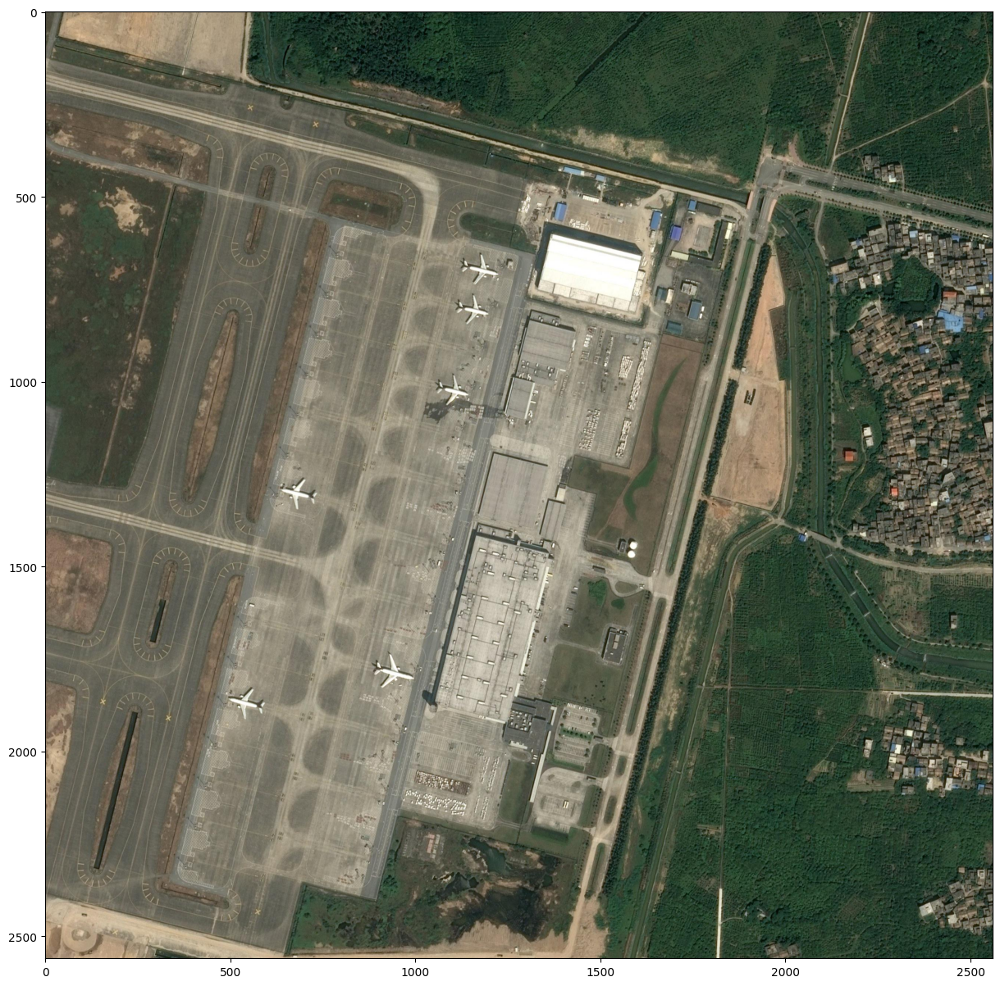

In [ ]:
def imread(filename):
    return cv2.cvtColor(cv2.imread(filename), cv2.COLOR_BGR2RGB)

data_folder = '/content/data/MyDrive/neuro/airbus'
imfiles = os.listdir(os.path.join(data_folder, 'images'))
imfiles = [os.path.join(data_folder, 'images', f) for f in imfiles if os.path.splitext(f)[-1] == '.jpg']

sample = random.choice(imfiles)
image = imread(sample)
rows, cols, channels = image.shape

plt.imshow(image)

print('Number of samples:', len(imfiles))
print('Image shape:      ', image.shape)

In [ ]:
assert all(cv2.imread(imfile).shape == (rows, cols, channels) for imfile in tqdm(imfiles))

  0%|          | 0/103 [00:00<?, ?it/s]

In [ ]:
def geo_to_ndarray(x):
    return np.array(ast.literal_eval(x))

annotations = pd.read_csv(data_folder + '/annotations.csv',
                          converters={'geometry': geo_to_ndarray})
annotations

,id,image_id,geometry,class
0,1,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[[135, 522], [245, 522], [245, 600], [135, 600...",Airplane
1,2,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[[1025, 284], [1125, 284], [1125, 384], [1025,...",Airplane
2,3,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[[1058, 1503], [1130, 1503], [1130, 1568], [10...",Airplane
3,4,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[[813, 1518], [885, 1518], [885, 1604], [813, ...",Airplane
4,5,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[[594, 938], [657, 938], [657, 1012], [594, 10...",Airplane
...,...,...,...,...
3420,3421,48ef8e15-a43c-406b-9d3c-e815164b96d1.jpg,"[[1059, 393], [1187, 393], [1187, 522], [1059,...",Airplane
3421,3422,48ef8e15-a43c-406b-9d3c-e815164b96d1.jpg,"[[932, 355], [1028, 355], [1028, 461], [932, 4...",Airplane
3422,3423,48ef8e15-a43c-406b-9d3c-e815164b96d1.jpg,"[[2461, 244], [2560, 244], [2560, 345], [2461,...",Truncated_airplane
3423,3424,48ef8e15-a43c-406b-9d3c-e815164b96d1.jpg,"[[1820, 344], [1937, 344], [1937, 443], [1820,...",Airplane


In [ ]:
Counter(annotations['class'])

Counter({'Airplane': 3316, 'Truncated_airplane': 109})

In [ ]:
assert all(len(geo) == 5 for geo in annotations['geometry'])
assert all(np.array_equal(geo[0, :], geo[-1, :]) for geo in annotations.geometry)

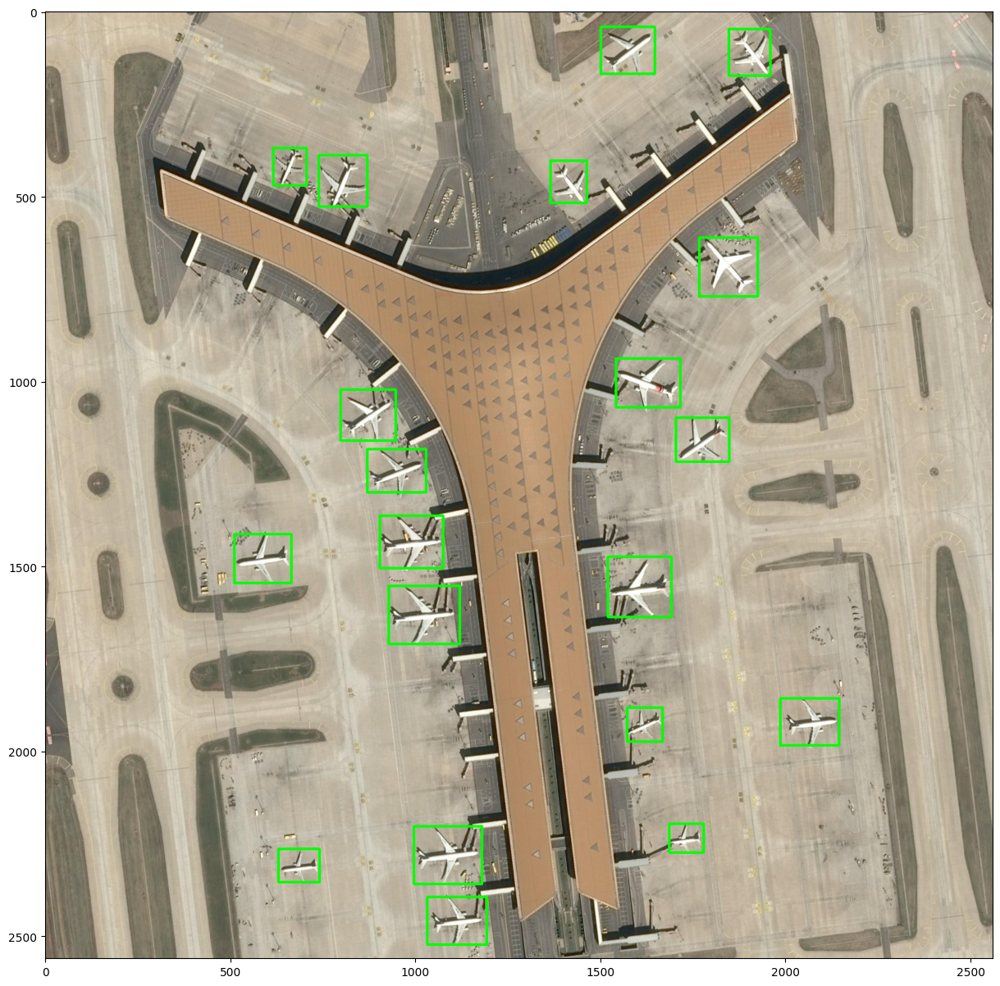

In [ ]:
sample = random.choice(imfiles)
image = imread(sample)

labels = annotations[annotations.image_id == os.path.basename(sample)]
points = [geo.reshape((-1, 1, 2)) for geo in labels.geometry]
cv2.polylines(image, points, isClosed=True, color=(0, 255, 0), thickness=5)

plt.imshow(image)

In [ ]:
def recompute_box_coors(box, x_origin, y_origin, width, height, threshold):
    """Recompute box coordinates to new origin

    Args:
        box (np.ndarray): Bounding box coordinates in form (x_min, y_min, x_max, y_max).
        x_origin (int): X coordinate of the origin of the new coordinate system.
        y_origin (int): Y coordinate of the origin of the new coordinate system.
        width (int): Width of the new coordinate system. Recomputed box coordinates
            that would fall beyond will be truncated.
        threshold (float): Rejection ratio of bounding box after truncation. Recomputed
            boxes that are heavily truncated will be discarded.

    Returns:
        (tuple): Recomputed bounding boxes in YOLOv8 data format.

    """
    # Recompute bounds coordinates to new reference
    x_min, y_min, x_max, y_max = box
    x_min, y_min, x_max, y_max = x_min - x_origin, y_min - y_origin, x_max - x_origin, y_max - y_origin

    # Return None if the box does not lie within image crop
    if (x_min > width) or (x_max < 0.0) or (y_min > height) or (y_max < 0.0):
        return None

    # Truncate box x coordinates if necessary
    x_max_trunc = min(x_max, width)
    x_min_trunc = max(x_min, 0)
    # Skip if truncate too much
    if (x_max_trunc - x_min_trunc) / (x_max - x_min) < threshold:
        return None

    # Repeat for y coordinates
    y_max_trunc = min(y_max, width)
    y_min_trunc = max(y_min, 0)
    if (y_max_trunc - y_min_trunc) / (y_max - y_min) < threshold:
        return None

    # Convert to YOLOv8 format
    x_center = (x_min_trunc + x_max_trunc) / 2.0 / width
    y_center = (y_min_trunc + y_max_trunc) / 2.0 / height
    x_extend = (x_max_trunc - x_min_trunc) / width
    y_extend = (y_max_trunc - y_min_trunc) / height

    return (0, x_center, y_center, x_extend, y_extend)

In [ ]:
def get_boxes(geometry):
    return np.min(geometry[:, 0]), np.min(geometry[:, 1]), np.max(geometry[:, 0]), np.max(geometry[:, 1])

annotations.loc[:,'boxes'] = annotations.loc[:,'geometry'].apply(get_boxes)
annotations.head(10)

,id,image_id,geometry,class,boxes
0,1,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[[135, 522], [245, 522], [245, 600], [135, 600...",Airplane,"(135, 522, 245, 600)"
1,2,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[[1025, 284], [1125, 284], [1125, 384], [1025,...",Airplane,"(1025, 284, 1125, 384)"
2,3,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[[1058, 1503], [1130, 1503], [1130, 1568], [10...",Airplane,"(1058, 1503, 1130, 1568)"
3,4,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[[813, 1518], [885, 1518], [885, 1604], [813, ...",Airplane,"(813, 1518, 885, 1604)"
4,5,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[[594, 938], [657, 938], [657, 1012], [594, 10...",Airplane,"(594, 938, 657, 1012)"
5,6,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[[451, 725], [524, 725], [524, 798], [451, 798...",Airplane,"(451, 725, 524, 798)"
6,7,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[[1543, 1437], [1614, 1437], [1614, 1497], [15...",Airplane,"(1543, 1437, 1614, 1497)"
7,8,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[[1485, 1370], [1561, 1370], [1561, 1437], [14...",Airplane,"(1485, 1370, 1561, 1437)"
8,9,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[[1968, 1624], [2053, 1624], [2053, 1687], [19...",Airplane,"(1968, 1624, 2053, 1687)"
9,10,4f833867-273e-4d73-8bc3-cb2d9ceb54ef.jpg,"[[1659, 1674], [1733, 1674], [1733, 1746], [16...",Airplane,"(1659, 1674, 1733, 1746)"


In [ ]:
fnames = list(annotations['image_id'].unique())
np.random.shuffle(fnames)
train_split = fnames[0:int(len(fnames)*0.8)]

print('Num samples', len(fnames))
print('Train split', len(train_split))
print('Val split  ', len(fnames) - len(train_split))

Num samples 103
Train split 82
Val split   21


In [ ]:
local_data_folder="/content/localdata"
os.mkdir(local_data_folder)

train_images_path = os.path.join(local_data_folder, 'train/images')
val_images_path = os.path.join(local_data_folder, 'val/images')
folder_crops = {'train': train_images_path,
                'val': val_images_path}

train_labels_path = os.path.join(local_data_folder, 'train/labels')
val_labels_path = os.path.join(local_data_folder, 'val/labels')

folder_labels = {'train': train_labels_path,
                 'val': val_labels_path}

for folders in [folder_crops, folder_labels]:
    for _, folder in folders.items():
        if not os.path.isdir(folder):
            os.makedirs(folder)

In [ ]:
crop_size = 512
crop_overlap = 64
trunc_th = 0.3
step = crop_size - crop_overlap


for imfile in (imfiles):
    image = cv2.imread(imfile)
    folder = 'train' if os.path.basename(imfile) in train_split else 'val'

    # Get annotations for image
    labels = annotations[annotations['image_id'] == os.path.basename(imfile)]
    img_id = os.path.splitext(os.path.basename(imfile))[0]

    # Extract crops
    for x_start in tqdm(np.arange(0, cols - crop_size, step)):
        for y_start in np.arange(0, rows - crop_size, step):

            x_end = x_start + crop_size
            y_end = y_start + crop_size

            filename_crop = os.path.join(folder_crops[folder],
                                         img_id + '_' + str(x_start) + '_' + str(y_start) + '.jpg')
            filename_label = os.path.join(folder_labels[folder],
                                          img_id + '_' + str(x_start) + '_' + str(y_start) + '.txt')

            crop = image[y_start:y_end, x_start:x_end, :]
            assert crop.shape == (crop_size, crop_size, channels)
            cv2.imwrite(filename_crop, crop)

            boxes = [recompute_box_coors(boxes, x_start, y_start, crop_size, crop_size, trunc_th)
                     for boxes in labels['boxes']]
            boxes = [box for box in boxes if box is not None]

            # save labels
            with open(filename_label, 'w+') as f:
                for box in boxes:
                    f.write(' '.join(str(x) for x in box) + '\n')

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

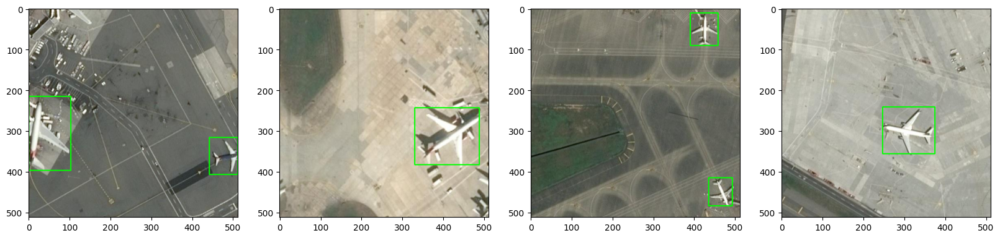

In [ ]:
for idx, sample in enumerate(np.random.choice(os.listdir(folder_crops['train']), 4)):

    # Load image and corresponding labels
    image = imread(os.path.join(folder_crops['train'], sample))
    with open(os.path.join(folder_labels['train'], sample.replace('.jpg', '.txt')), 'r') as f:
        labels = f.readlines()

    for box in labels:
        box = np.array([d for d in box.split(' ')], dtype=np.float32)

        # Undo coordinate normalization
        x_center = box[1] * crop_size
        y_center = box[2] * crop_size

        width = box[3] * crop_size
        height = box[4] * crop_size

        # Convert from YOLOv8 format to OpenCV rectangle format
        x_start, y_start = int(x_center - width/2), int(y_center - height/2)
        x_end, y_end = int(x_center + width/2), int(y_center + height/2)

        cv2.rectangle(image, (x_start, y_start), (x_end, y_end), color=(0, 255, 0), thickness=2)

    plt.subplot(1,4,idx+1), plt.imshow(image)

In [ ]:
model = YOLO("yolov8s.pt")
model.info()

100%|██████████| 21.5M/21.5M [00:00<00:00, 255MB/s]


YOLOv8s summary: 225 layers, 11166560 parameters, 0 gradients, 28.8 GFLOPs


(225, 11166560, 0, 28.816844800000002)

In [ ]:
model

YOLO(
  (model): DetectionModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (2): C2f(
        (cv1): Conv(
          (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
          (act): SiLU(inplace=True)
        )
        (cv2): Conv(
          (conv): Conv2d(96, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(64, eps=0.001, momentum=0.03, affine=True, track_running_s

In [ ]:
results[0].boxes

NameError: name 'results' is not defined


0: 640x640 2 toilets, 436.4ms
Speed: 13.9ms preprocess, 436.4ms inference, 26.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 airplanes, 296.9ms
Speed: 4.1ms preprocess, 296.9ms inference, 4.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 256.1ms
Speed: 7.4ms preprocess, 256.1ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 airplanes, 172.8ms
Speed: 5.3ms preprocess, 172.8ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


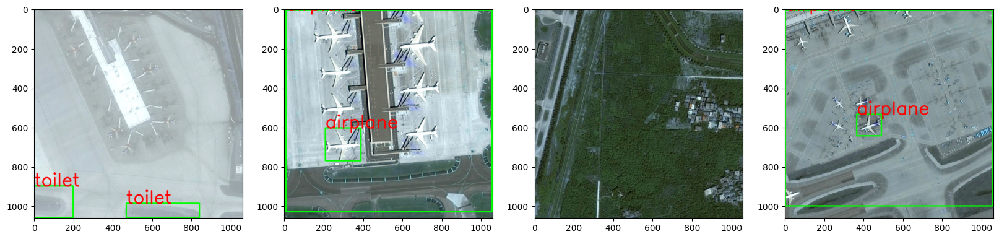

In [ ]:
for idx, sample in enumerate(np.random.choice(imfiles, 4)):
    image = cv2.imread(sample)
    image = image[1500:, 1500:, :]

    result = model.predict(image, conf=0.2)[0]
    boxes = result.boxes.cpu().numpy().xyxy.astype(np.int16)

    for box_idx, box in enumerate(boxes):
        start, stop = box[0:2], box[2:]
        cv2.rectangle(image, start, stop, color=(0, 255, 0), thickness=5)
        font = cv2.FONT_HERSHEY_SIMPLEX
        image = cv2.putText(image, result.names[result.boxes.cls[box_idx].item()], (box[0], box[1]),
                            cv2.FONT_HERSHEY_SIMPLEX, 3, (255, 0, 0), 6, cv2.LINE_AA)

    plt.subplot(1,4,idx+1), plt.imshow(image)

In [ ]:
config = """
# train and val datasets (image directory or *.txt file with image paths)
train: /content/localdata/train
val: /content/localdata/val

# number of classes
nc: 1

# class names
names: ['Aircraft']
"""

with open("/content/localdata/data.yaml", "w") as f:
    f.write(config)

In [ ]:
root = "/content/localdata/"
!yolo task=detect mode=train model=yolov8s.pt data={root}/data.yaml epochs=10 imgsz=512 mosaic=0.0 flipud=0.5 scale=0.0 verbose=True

New https://pypi.org/project/ultralytics/8.1.42 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.1.41 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.20GHz)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/localdata//data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=512, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_f

/content/data/MyDrive/neuro/airbus/images/ed921ec7-b950-460c-a912-12247d867fea.jpg
(2560, 2560, 3)

0: 512x512 (no detections), 143.4ms
Speed: 2.6ms preprocess, 143.4ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 512)


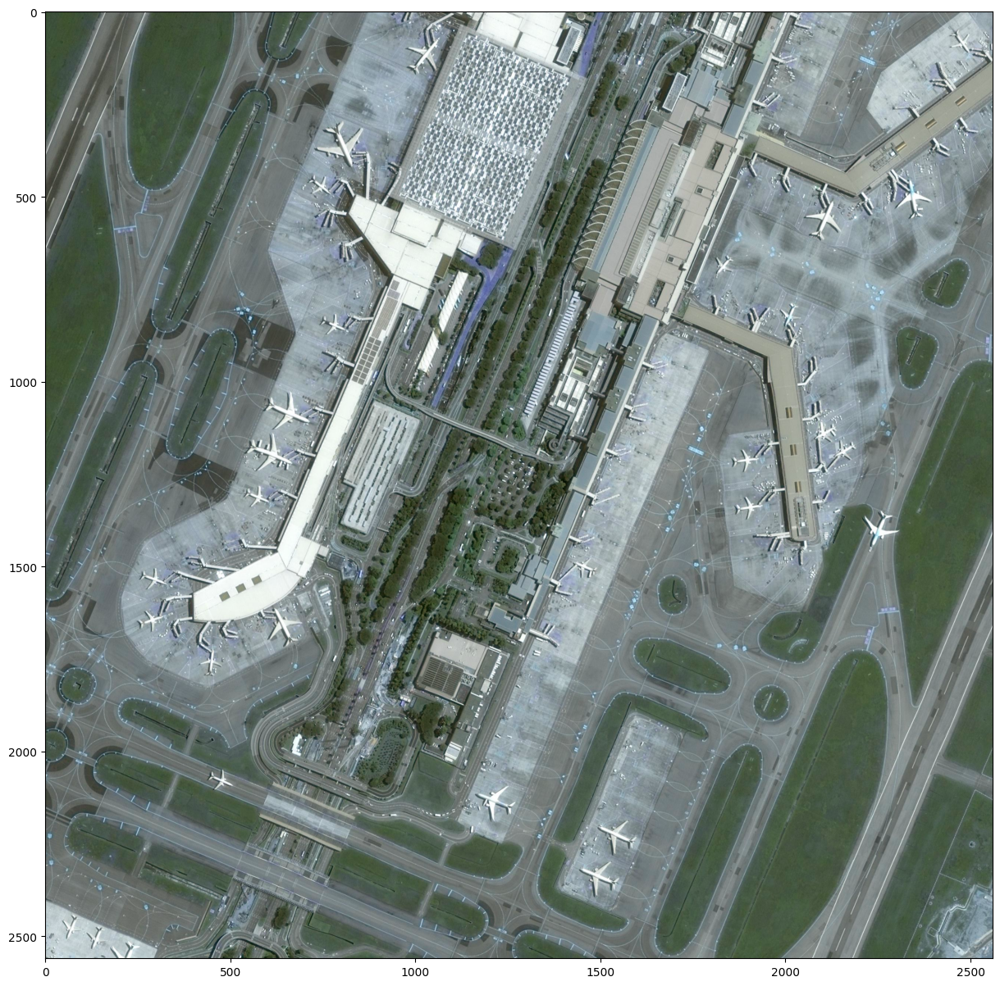

In [ ]:
#/content/data/MyDrive/neuro/runs/detect/train/weights/best.pt
#/content/runs/detect/train/weights/best.pt
retrained = YOLO('/content/data/MyDrive/neuro/runs/detect/train/weights/best.pt')

file = np.random.choice(imfiles, 1)[0]
print(file)
image1 = cv2.imread(file)
print(image1.shape)
plt.imshow(image1)
image1 = image1[:512, :512, :]
result = retrained.predict(image1, conf=0.2)[0]
#print(result[0])
boxes = result.boxes.cpu().numpy().xyxy.astype(np.int16)
for box_idx, box in enumerate(boxes):
        start, stop = box[0:2], box[2:]
        cv2.rectangle(image1, start, stop, color=(0, 255, 0), thickness=5)
        font = cv2.FONT_HERSHEY_SIMPLEX
        image1 = cv2.putText(image1, result.names[result.boxes.cls[box_idx].item()], (box[0], box[1]),
                            cv2.FONT_HERSHEY_SIMPLEX, 3, (255, 0, 0), 6, cv2.LINE_AA)



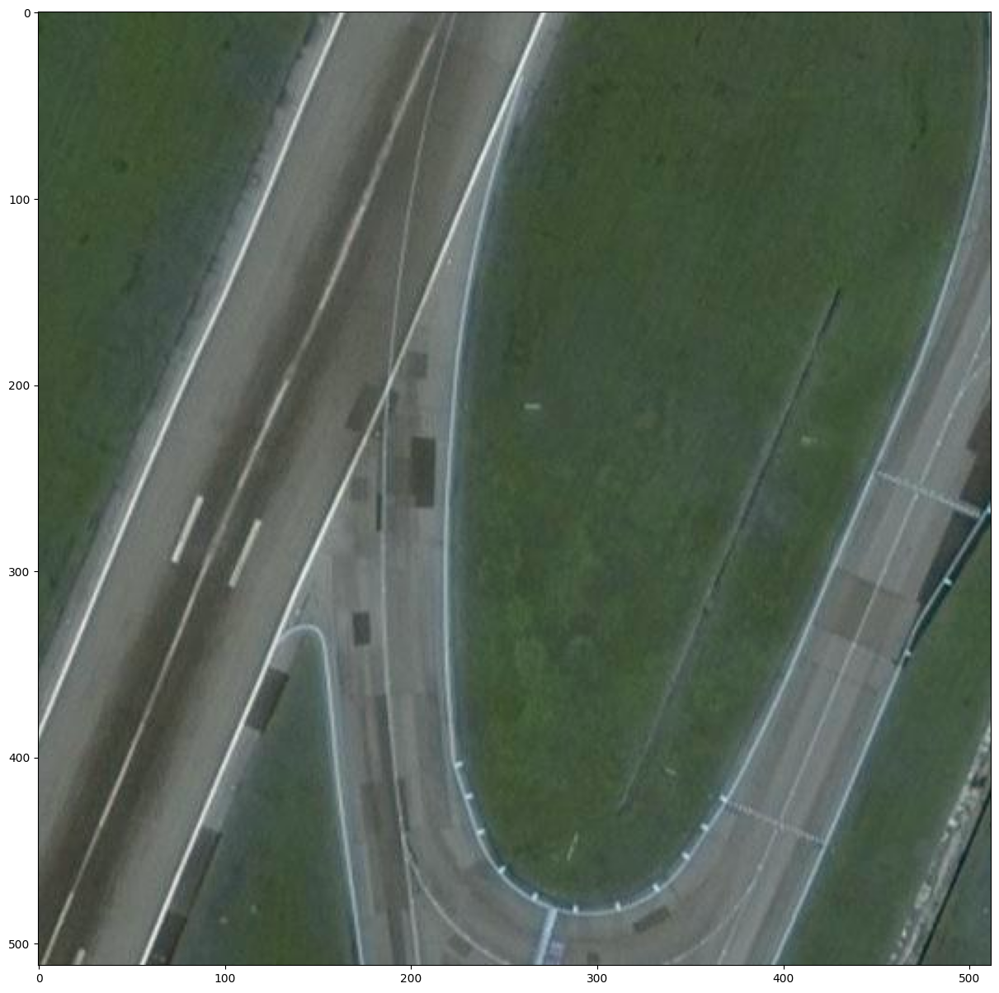

In [ ]:
plt.imshow(image1)


0: 640x640 1 traffic light, 286.4ms
Speed: 11.4ms preprocess, 286.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 512x512 (no detections), 243.0ms
Speed: 3.0ms preprocess, 243.0ms inference, 0.7ms postprocess per image at shape (1, 3, 512, 512)

0: 640x640 3 airplanes, 324.7ms
Speed: 4.1ms preprocess, 324.7ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)

0: 512x512 4 Aircrafts, 209.2ms
Speed: 2.7ms preprocess, 209.2ms inference, 1.3ms postprocess per image at shape (1, 3, 512, 512)

0: 640x640 (no detections), 329.8ms
Speed: 3.9ms preprocess, 329.8ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

0: 512x512 6 Aircrafts, 273.2ms
Speed: 2.6ms preprocess, 273.2ms inference, 1.1ms postprocess per image at shape (1, 3, 512, 512)

0: 640x640 (no detections), 216.2ms
Speed: 5.7ms preprocess, 216.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)

0: 512x512 7 Aircrafts, 162.2ms
Speed: 2.8ms preprocess, 162.2ms 

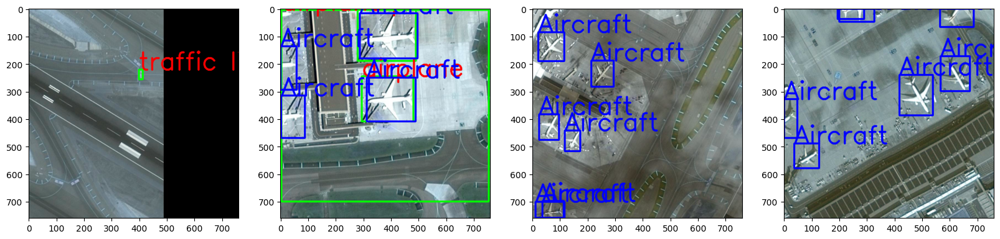

In [ ]:
for idx, sample in enumerate(np.random.choice(imfiles, 4)):
    image = cv2.imread(sample)
    image = image[1800:, 1800:, :]

    result = model.predict(image, conf=0.2)[0]
    boxes = result.boxes.cpu().numpy().xyxy.astype(np.int16)

    for box_idx, box in enumerate(boxes):
        start, stop = box[0:2], box[2:]
        cv2.rectangle(image, start, stop, color=(0, 255, 0), thickness=5)
        font = cv2.FONT_HERSHEY_SIMPLEX
        image = cv2.putText(image, result.names[result.boxes.cls[box_idx].item()], (box[0], box[1]),
                            cv2.FONT_HERSHEY_SIMPLEX, 3, (255, 0, 0), 6, cv2.LINE_AA)

    result = retrained.predict(image, conf=0.2)[0]
    boxes = result.boxes.cpu().numpy().xyxy.astype(np.int16)

    for box_idx, box in enumerate(boxes):
        start, stop = box[0:2], box[2:]
        cv2.rectangle(image, start, stop, color=(0, 0, 255), thickness=5)
        font = cv2.FONT_HERSHEY_SIMPLEX
        image = cv2.putText(image, result.names[result.boxes.cls[box_idx].item()], (box[0], box[1]),
                            cv2.FONT_HERSHEY_SIMPLEX, 3, (0, 0, 255), 6, cv2.LINE_AA)

    plt.subplot(1,4,idx+1), plt.imshow(image)

In [ ]:

model = YOLO('/content/data/MyDrive/neuro/runs/detect/train/weights/best.pt')
model.export(format='tflite',int8=True)


Ultralytics YOLOv8.1.42 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.20GHz)
Model summary (fused): 168 layers, 11125971 parameters, 0 gradients, 28.4 GFLOPs

PyTorch: starting from '/content/data/MyDrive/neuro/runs/detect/train/weights/best.pt' with input shape (1, 3, 512, 512) BCHW and output shape(s) (1, 5, 5376) (21.5 MB)

TensorFlow SavedModel: starting export with tensorflow 2.13.1...

ONNX: starting export with onnx 1.15.0 opset 17...
ONNX: simplifying with onnxsim 0.4.33...
ONNX: export success ✅ 9.3s, saved as '/content/data/MyDrive/neuro/runs/detect/train/weights/best.onnx' (42.6 MB)
TensorFlow SavedModel: starting TFLite export with onnx2tf 1.17.5...

Automatic generation of each OP name started ========================================
Automatic generation of each OP name complete!

Model loaded ========================================================================

Model conversion started ============================================================
saved_model out

'/content/data/MyDrive/neuro/runs/detect/train/weights/best_saved_model/best_int8.tflite'

In [ ]:
# вот тут идет работа уже с int8.tflite моделью. Которую экспортировал на предыдущем этапе.
# картинку слайсю на 512*512 куски загоняю по очереди в модель и потом результат складываю а одно изображение
# и потом показываю как одно изображение. Вероятно надо нанести на изображение сетку разбивки на слайсы
# что бы понять почему некоторые самолеты обведены несколько раз (он попал на два или более фрагментов)
from ultralytics.utils.plotting import Annotator
from ultralytics.engine.results import Results
from ultralytics.utils import ops


def slice_image(image_path, slice_size=512):
    img = cv2.imread(image_path)
    slices = []
    height, width = img.shape[:2]

    for x in range(0, width, slice_size):
        line = []
        for y in range(0, height, slice_size):
            slice_img = img[y:y + slice_size, x:x + slice_size]
            line.append(np.ascontiguousarray(slice_img))
        slices.append(line)
    return slices


def merge_images(slices):
    img = None
    for line in slices:
        line_img = None
        for slice_img in line:
            if line_img is None:
                line_img = slice_img
            else:
                line_img = np.concatenate((line_img, slice_img), axis=0)
        if img is None:
            img = line_img
        else:
            img = np.concatenate((img, line_img), axis=1)
    return img

def predict1(interpreter, frame, conf, label_names):
    orig_imgs = [frame]

    input_details = interpreter.get_input_details()
    output_details = interpreter.get_output_details()

    input_shape = input_details[0]['shape']

    _, w, h, _ = input_shape

    if frame.shape[0] != h or frame.shape[1] != w:
        input_img = cv2.resize(frame, (w, h))
    else:
        input_img = frame
    input_img = input_img[np.newaxis, ...]

    input_img = input_img.astype(np.float32) / 255.  # change to float img
    interpreter.set_tensor(input_details[0]['index'], input_img)

    interpreter.invoke()

    preds = interpreter.get_tensor(output_details[0]['index'])

    preds = torch.from_numpy(preds)
     # hack. just copied values from execution of yolov8n.pt :(
    preds = ops.non_max_suppression(preds,
                                    conf,
                                    0.7,
                                    agnostic=False,
                                    max_det=300,
                                    classes=None)

    results = []
    for i, pred in enumerate(preds):
        orig_img = orig_imgs[i]

        pred[:, :4] *= w

        pred[:, :4] = ops.scale_boxes(input_img.shape[1:], pred[:, :4], orig_img.shape)
        img_path = ""
        results.append(Results(orig_img, path=img_path, names=label_names, boxes=pred))

    return results

def draw_annotation(img, label_names, results):
    annotator = None
    for r in results:
        annotator = Annotator(img)

        boxes = r.boxes
        for box in boxes:
            b = box.xyxy[0]
            c = box.cls
            annotator.box_label(b, label_names[int(c)], color=(0, 255, 0), txt_color=(0, 0, 0))

    if annotator is not None:
        annotated_img = annotator.result()
    else:
        annotated_img = img.copy()

    return annotated_img


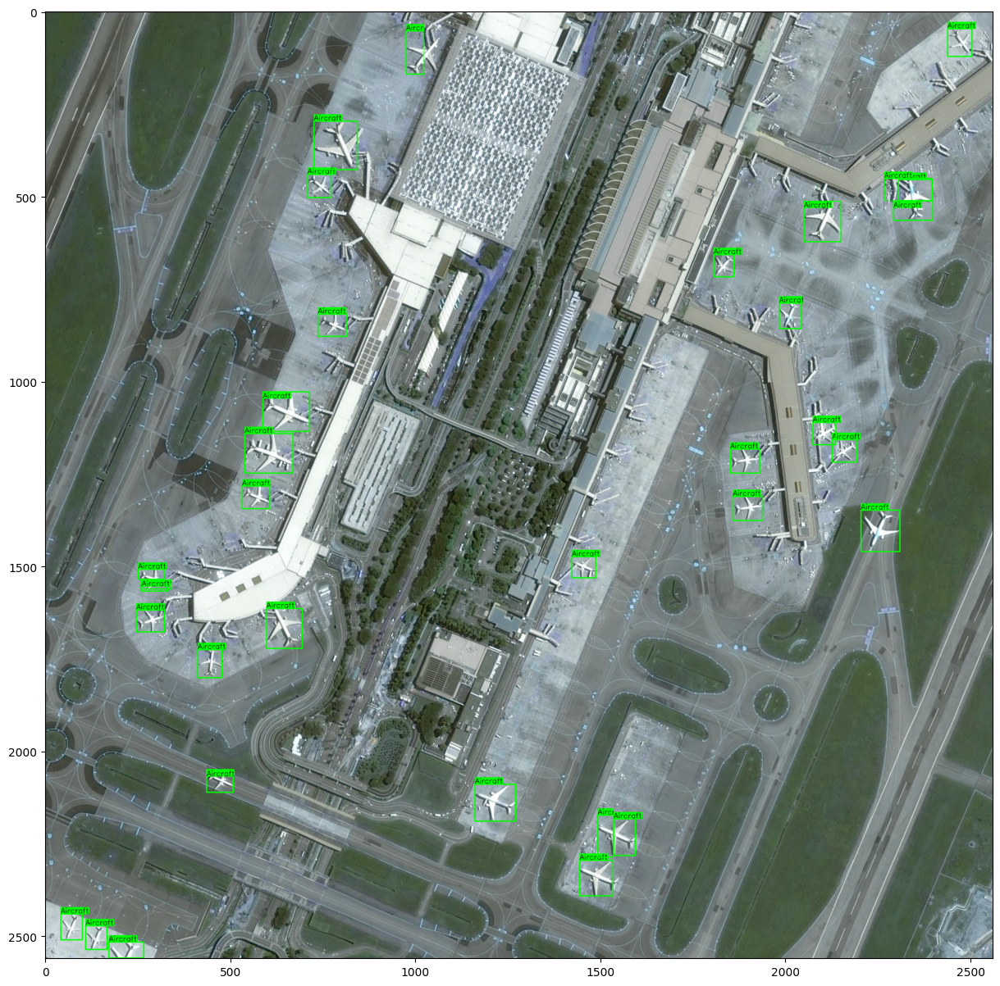

In [ ]:

interpreter = tf.lite.Interpreter(model_path="/content/data/MyDrive/neuro/runs/detect/train/weights/best_saved_model/best_int8.tflite")

interpreter.allocate_tensors()

slised = slice_image("/content/data/MyDrive/neuro/airbus/images/ed921ec7-b950-460c-a912-12247d867fea.jpg")

labels1 = ["Aircraft"]

for line in slised:
    for slice_img in line:
        results = predict1(interpreter, slice_img, conf=0.2, label_names=labels1)
        #results = model.predict(slice_img, conf=0.2)
        # print("**********************************************")
        # print(results)
        # print("**********************************************")
        slice_img = draw_annotation(slice_img, labels1, results)


plt.imshow(merge_images(slised))